In [5]:
import numpy as np
import pandas as pd
import os
import librosa
from IPython.display import Audio
import matplotlib.pyplot as plt
import librosa.display
from scipy import stats

In [6]:
audios_path = 'D:\P\Pr\MClasifier/Rolas/LF'
audios = os.listdir(audios_path)

<>:1: SyntaxWarning: invalid escape sequence '\P'
<>:1: SyntaxWarning: invalid escape sequence '\P'
C:\Users\pabce\AppData\Local\Temp\ipykernel_7244\3584798771.py:1: SyntaxWarning: invalid escape sequence '\P'
  audios_path = 'D:\P\Pr\MClasifier/Rolas/LF'


In [7]:
sample_path = []
for filename in audios:
    sample_path.append(os.path.join(audios_path, filename))

In [8]:
df = pd.DataFrame(sample_path,columns=['path'])
df

,path
0,D:\P\Pr\MClasifier/Rolas/LF\1. kudasaibeats - ...
1,D:\P\Pr\MClasifier/Rolas/LF\10. slipfunc - day...
2,D:\P\Pr\MClasifier/Rolas/LF\11. the girl next ...
3,D:\P\Pr\MClasifier/Rolas/LF\12. cucu [回顧] - i ...
4,D:\P\Pr\MClasifier/Rolas/LF\13. Taiko - Leaves...
...,...
66,D:\P\Pr\MClasifier/Rolas/LF\7. Kyoshin - Blurr...
67,D:\P\Pr\MClasifier/Rolas/LF\70. sanctuary ship...
68,D:\P\Pr\MClasifier/Rolas/LF\71. Lazy Lewis - D...
69,D:\P\Pr\MClasifier/Rolas/LF\8. n u a g e s - c...


In [9]:
first_sample = df['path'].iloc[0]
print(first_sample)
first_sample_data, first_sample_sr = librosa.load(first_sample)

D:\P\Pr\MClasifier/Rolas/LF\1. kudasaibeats - the girl i haven't met-XDpoBc8t6gE.mp3


In [10]:
Audio(first_sample_data, rate=first_sample_sr)

In [11]:
stats.describe(first_sample_data)

DescribeResult(nobs=4302336, minmax=(np.float32(-0.9394934), np.float32(0.84740067)), mean=np.float32(-0.004703848), variance=np.float64(0.00694550316166306), skewness=np.float64(-0.1340024769306183), kurtosis=np.float32(13.970295))

In [12]:
def get_amplitude_envelope(signal, frame_size, window_size):
    envelope = []
    for i in range(0, len(signal), window_size):
        frame_data = signal[i:i+frame_size]
        max_amp = max(frame_data)
        envelope.append(max_amp)
    return np.array(envelope)

In [13]:
def get_rms(signal,frame_size,window_size):
  rms = librosa.feature.rms(y=signal, frame_length=frame_size, hop_length=window_size)[0]
  return rms

In [14]:
def get_zcr(y, frame_length, hop_length):
    return librosa.feature.zero_crossing_rate(y, frame_length=frame_length, hop_length=hop_length)[0]

In [15]:
def extract_time_domain_features(path):
    song_data, _ = librosa.load(path)
    FRAME_SIZE = 1024
    WINDOW_SIZE = 128
    ae = get_amplitude_envelope(song_data, FRAME_SIZE, WINDOW_SIZE)
    rms = get_rms(song_data, FRAME_SIZE, WINDOW_SIZE)
    zcr = get_zcr(song_data, FRAME_SIZE, WINDOW_SIZE)
    ae_stats = stats.describe(ae)
    rms_stats = stats.describe(rms)
    zcr_stats = stats.describe(zcr)
    data_features_vector = [
        ae_stats.minmax[0], ae_stats.minmax[1], ae_stats.mean, ae_stats.variance,
        rms_stats.minmax[0], rms_stats.minmax[1], rms_stats.mean, rms_stats.variance,
        zcr_stats.minmax[0], zcr_stats.minmax[1], zcr_stats.mean, zcr_stats.variance
    ]
    return data_features_vector

In [16]:
df["time_vector"] = df["path"].apply(extract_time_domain_features)

In [17]:
feature_names = [
    'min_ae', 'max_ae', 'mean_ae', 'variance_ae',
    'min_rms', 'max_rms', 'mean_rms', 'variance_rms',
    'min_zcr', 'max_zcr', 'mean_zcr', 'variance_zcr'
]

for i, feature in enumerate(feature_names):
    df[feature] = df['time_vector'].apply(lambda x: x[i])

df = df.drop("time_vector", axis="columns")

In [18]:
def extract_freq_domain_features(path):
    song_data,_ = librosa.load(path)
    fq = np.abs(np.fft.fft(song_data))
    fq_stats = stats.describe(fq)
    return [fq_stats.minmax[0],fq_stats.minmax[1],fq_stats.mean,fq_stats.variance]

In [19]:
df["freq_vector"] = df["path"].apply(extract_freq_domain_features)

In [20]:
frequency_names = [
    'min_fq', 'max_fq', 'mean_fq', 'variance_fq'
]

for i, feature in enumerate(frequency_names):
    df[feature] = df['freq_vector'].apply(lambda x: x[i])

df = df.drop("freq_vector",axis="columns")

In [21]:
df.to_csv('D:\P\Pr\MClasifier/Rolas/SP.csv',index=False)
df.head(5)

<>:1: SyntaxWarning: invalid escape sequence '\P'
<>:1: SyntaxWarning: invalid escape sequence '\P'
C:\Users\pabce\AppData\Local\Temp\ipykernel_7244\700209.py:1: SyntaxWarning: invalid escape sequence '\P'
  df.to_csv('D:\P\Pr\MClasifier/Rolas/SP.csv',index=False)


,path,min_ae,max_ae,mean_ae,variance_ae,min_rms,max_rms,mean_rms,variance_rms,min_zcr,max_zcr,mean_zcr,variance_zcr,min_fq,max_fq,mean_fq,variance_fq
0,D:\P\Pr\MClasifier/Rolas/LF\1. kudasaibeats - ...,0.000000e+00,0.847401,0.125013,0.019875,0.0,0.429127,0.055240,0.003916,0.0,0.206055,0.037356,0.000404,1.152625e-07,25124.673828,29.272799,29120.190362
1,D:\P\Pr\MClasifier/Rolas/LF\10. slipfunc - day...,-1.342078e-07,1.015615,0.344738,0.058118,0.0,0.518771,0.137613,0.010721,0.0,0.488281,0.059150,0.002677,1.672221e-07,61792.007812,66.652588,96934.114296
2,D:\P\Pr\MClasifier/Rolas/LF\11. the girl next ...,0.000000e+00,1.040490,0.300174,0.072752,0.0,0.688639,0.134553,0.015835,0.0,0.396484,0.041918,0.001167,5.775153e-07,104251.828125,88.033890,174331.391871
3,D:\P\Pr\MClasifier/Rolas/LF\12. cucu [回顧] - i ...,0.000000e+00,1.093611,0.284100,0.082478,0.0,0.666272,0.152648,0.033059,0.0,0.485352,0.053935,0.002842,1.460697e-06,160120.218750,69.374062,301270.336725
4,D:\P\Pr\MClasifier/Rolas/LF\13. Taiko - Leaves...,0.000000e+00,0.873519,0.326224,0.037596,0.0,0.436503,0.143338,0.007588,0.0,0.442383,0.026688,0.000550,2.675274e-07,58201.878906,63.987087,132057.152288


In [22]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

features = df.drop(['path'], axis=1)
name = df['path']

scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

pca = PCA()
principal_components = pca.fit_transform(features_scaled)
print(f"Number of components selected to retain 85% variance: {pca.n_components_}")
print(pca.explained_variance_ratio_)

Number of components selected to retain 85% variance: 16
[4.06968022e-01 1.75379393e-01 1.44398359e-01 8.83709456e-02
 4.88714025e-02 3.13816254e-02 2.87681475e-02 2.28004298e-02
 1.44221348e-02 1.22936971e-02 1.00544267e-02 6.70924379e-03
 4.94130794e-03 2.88678426e-03 1.68581950e-03 6.82612094e-05]


In [23]:
pd.DataFrame(
    data    = pca.components_,
    columns = features.columns,
    index   = ['PC1', 'PC2', 'PC3', 'PC4','PC5', 'PC6', 'PC7', 'PC8','PC9', 'PC10', 'PC11', 'PC12','PC13', 'PC14', 'PC15', 'PC16']
)

,min_ae,max_ae,mean_ae,variance_ae,min_rms,max_rms,mean_rms,variance_rms,min_zcr,max_zcr,mean_zcr,variance_zcr,min_fq,max_fq,mean_fq,variance_fq
PC1,0.038786,0.328208,0.346581,0.341542,0.045436,0.342095,0.352821,0.329251,0.029678,0.081335,0.117372,0.124768,0.027992,0.201612,0.339548,0.329334
PC2,0.214610,0.029554,-0.116681,0.146776,-0.026372,-0.045279,-0.170222,0.053040,0.116597,0.475200,0.503871,0.486262,0.055910,-0.329399,0.005768,-0.204857
PC3,0.046007,0.052843,0.039311,-0.087546,0.593709,0.032762,0.032172,-0.099309,0.556485,-0.054552,-0.072283,-0.051918,0.542548,-0.069869,-0.036386,-0.016853
PC4,0.714852,-0.021556,0.260554,-0.110566,-0.069058,-0.087145,0.137057,-0.152216,-0.091209,-0.094894,-0.063880,-0.244637,-0.042272,-0.468978,0.184325,0.130908
PC5,-0.254824,-0.271904,0.194817,-0.316091,-0.066289,-0.380048,0.164604,-0.325569,-0.085392,0.028976,0.310186,0.178108,0.211149,0.134928,0.402165,0.284168
PC6,-0.252297,0.424115,0.095812,-0.101353,-0.277020,0.240415,0.053778,-0.412087,-0.094779,0.452758,-0.152679,-0.262083,0.243623,-0.147070,0.067471,-0.195624
PC7,0.072995,0.241676,-0.057559,0.017468,-0.030220,0.033344,-0.056569,0.085267,-0.553165,-0.443004,0.188072,0.143471,0.573478,-0.022562,-0.127327,-0.127879
PC8,0.192958,-0.427582,-0.122734,0.077058,-0.123638,-0.012219,-0.060529,0.297419,-0.177104,0.479806,-0.237199,-0.175932,0.447352,0.185898,-0.093581,0.243201
PC9,0.084728,0.057779,0.169048,-0.221316,0.619923,-0.035014,0.173418,-0.072935,-0.482898,0.323716,-0.099283,0.148904,-0.229642,0.142271,-0.192673,-0.104353
PC10,-0.081831,-0.033444,0.328856,-0.008882,-0.291329,-0.270548,0.437823,0.144240,0.151811,-0.025165,-0.371306,0.408527,0.104161,-0.146545,-0.349449,-0.174687


In [24]:
pca = PCA(n_components=2)
principal_components = pca.fit_transform(features_scaled)
principal_df = pd.DataFrame(data = principal_components, columns = ['PC1', 'PC2'], index = name)
principal_df.tail(5)


,PC1,PC2
path,,
D:\P\Pr\MClasifier/Rolas/LF\7. Kyoshin - Blurry Nights-i53jh0-iSBo.mp3,-3.973279,-0.485068
D:\P\Pr\MClasifier/Rolas/LF\70. sanctuary ship-knkJY77SgNM.mp3,4.021354,-2.487897
D:\P\Pr\MClasifier/Rolas/LF\71. Lazy Lewis - Dancing Days-AsOsuVDkqfo.mp3,0.334665,0.042345
D:\P\Pr\MClasifier/Rolas/LF\8. n u a g e s - closer-DHITmcKUGik.mp3,-0.043531,-1.077762
D:\P\Pr\MClasifier/Rolas/LF\9. slipfunc - glance-L5Jb0wE9LtI.mp3,-2.104689,-0.611326


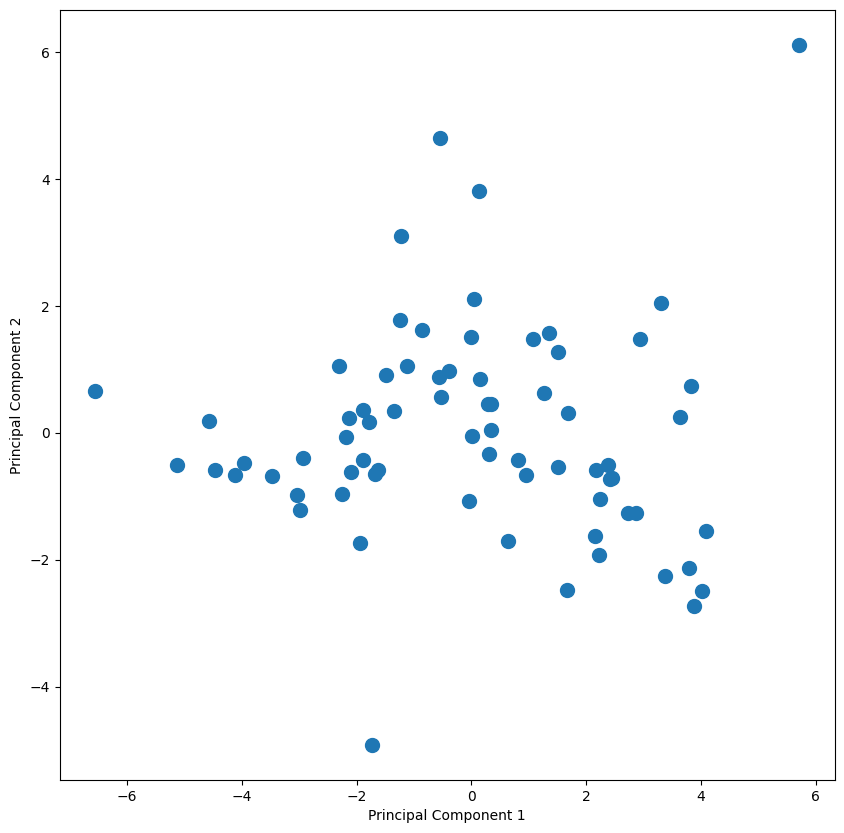

In [25]:
plt.figure(figsize=(10,10))
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.scatter(principal_df['PC1'], principal_df['PC2'], s=100)
plt.show()

In [26]:
pca = PCA(n_components=2)
pca_components = pca.fit_transform(features_scaled)
print(pca.explained_variance_ratio_)
print(pca_components)

[0.40696802 0.17537939]
[[-3.47568641 -0.68689866]
 [-0.57170328  0.87003821]
 [ 0.31211086 -0.32982368]
 [ 1.68794174  0.30257747]
 [-1.67757795 -0.64673416]
 [-4.12573703 -0.66153745]
 [-4.56815147  0.18099895]
 [-0.39722414  0.97535346]
 [-1.88474314  0.36157505]
 [-4.47313997 -0.5916155 ]
 [-1.79020659  0.17563081]
 [-2.13978358  0.22426022]
 [ 2.16796506 -0.58352943]
 [-1.94017309 -1.73395687]
 [-1.34288499  0.34381975]
 [-5.12772708 -0.51178169]
 [ 0.14234758  0.84209774]
 [ 1.26063975  0.63279979]
 [-1.89638017 -0.43103003]
 [ 0.00947502 -0.04991271]
 [-1.74109521 -4.91568846]
 [ 5.71503313  6.11221959]
 [-2.92861813 -0.40367   ]
 [-0.53923083  0.56956232]
 [ 2.45475383 -0.71952343]
 [ 1.06660867  1.48222901]
 [-2.19182847 -0.07051408]
 [ 2.22284229 -1.92495219]
 [-1.12535543  1.05770078]
 [-3.0433708  -0.9742795 ]
 [ 1.35283834  1.57348787]
 [ 2.23180978 -1.04473681]
 [ 3.63357418  0.24638648]
 [-2.98451054 -1.21225627]
 [-1.2391738   1.77288225]
 [ 0.04723437  2.10989694]
 [-0

In [27]:
pca_df = pd.DataFrame(data=pca_components, columns=['PCA_1', 'PCA_2'])
pca_df['path'] = df['path']
pca_df.head(5)

,PCA_1,PCA_2,path
0,-3.475686,-0.686899,D:\P\Pr\MClasifier/Rolas/LF\1. kudasaibeats - ...
1,-0.571703,0.870038,D:\P\Pr\MClasifier/Rolas/LF\10. slipfunc - day...
2,0.312111,-0.329824,D:\P\Pr\MClasifier/Rolas/LF\11. the girl next ...
3,1.687942,0.302577,D:\P\Pr\MClasifier/Rolas/LF\12. cucu [回顧] - i ...
4,-1.677578,-0.646734,D:\P\Pr\MClasifier/Rolas/LF\13. Taiko - Leaves...


C:\Users\pabce\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 22238 (\N{CJK UNIFIED IDEOGRAPH-56DE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\pabce\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 39015 (\N{CJK UNIFIED IDEOGRAPH-9867}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\pabce\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 31169 (\N{CJK UNIFIED IDEOGRAPH-79C1}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\pabce\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 12399 (\N{HIRAGANA LETTER HA}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\pabce\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:170: Us

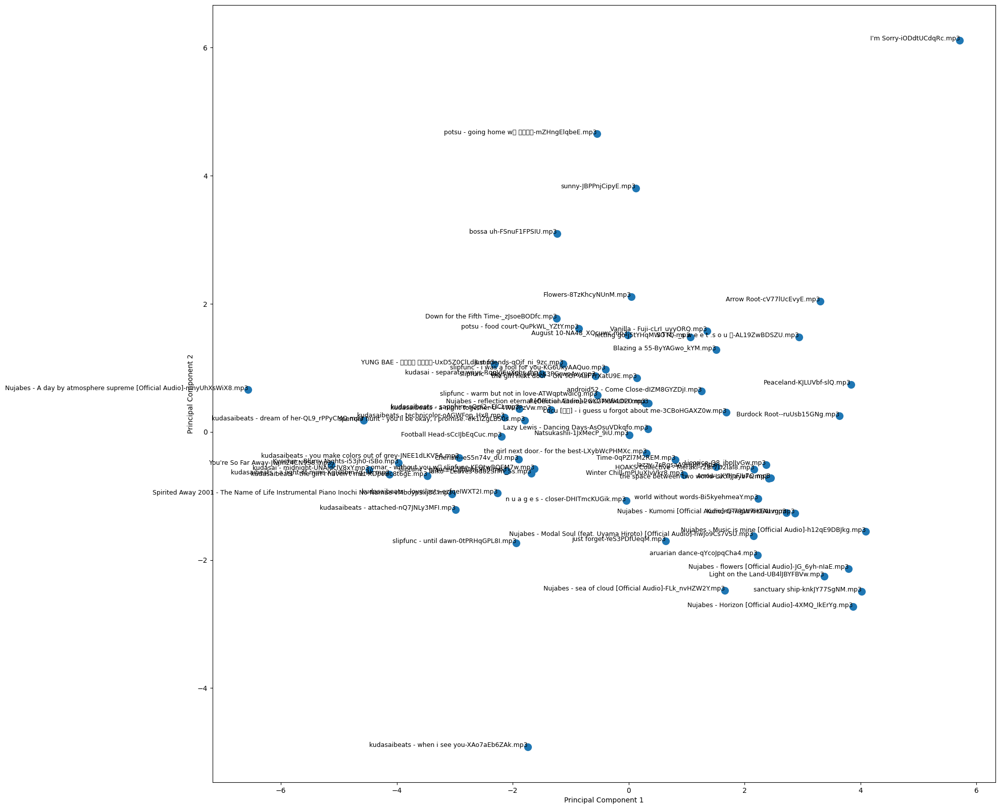

In [28]:
plt.figure(figsize=(20,20))
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.scatter(pca_df['PCA_1'], pca_df['PCA_2'], s=100, )

for i in range(len(pca_df)):
    plt.text(pca_df['PCA_1'][i], pca_df['PCA_2'][i], 
             pca_df['path'][i].split('. ', 1)[-1],
             fontsize=9, ha='right')

plt.show()

In [29]:
from sklearn.cluster import KMeans
from sklearn.cluster import AffinityPropagation
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

In [30]:
kmeans = KMeans(
    n_clusters = 4,
    init="random",
    n_init=100,
    max_iter=300,
    random_state=42
)

In [31]:
kmeans.fit(pca_components)

KMeans(init='random', n_clusters=4, n_init=100, random_state=42)

In [32]:
kmeans.n_iter_

3

In [33]:
kmeans.labels_

array([3, 0, 0, 2, 3, 3, 3, 0, 3, 3, 3, 3, 2, 3, 0, 3, 0, 0, 3, 0, 3, 1,
       3, 0, 2, 0, 3, 2, 0, 3, 0, 2, 2, 3, 0, 0, 0, 3, 0, 2, 2, 2, 2, 2,
       0, 2, 3, 2, 0, 2, 1, 2, 0, 0, 0, 3, 2, 3, 2, 0, 1, 1, 0, 2, 2, 0,
       3, 2, 0, 0, 3], dtype=int32)

C:\Users\pabce\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 22238 (\N{CJK UNIFIED IDEOGRAPH-56DE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\pabce\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 39015 (\N{CJK UNIFIED IDEOGRAPH-9867}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\pabce\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 31169 (\N{CJK UNIFIED IDEOGRAPH-79C1}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\pabce\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 12399 (\N{HIRAGANA LETTER HA}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\pabce\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:170: Us

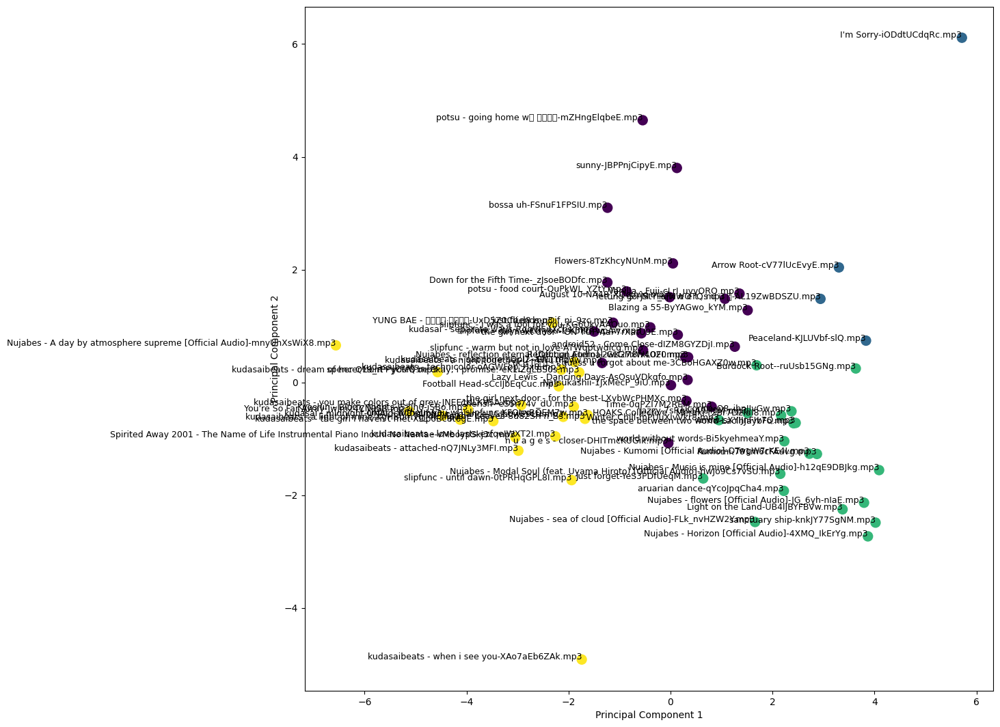

In [34]:
plt.figure(figsize=(13,13))
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.scatter(pca_df['PCA_1'], pca_df['PCA_2'], s=100, c=kmeans.labels_)

for i in range(len(pca_df)):
    plt.text(pca_df['PCA_1'][i], pca_df['PCA_2'][i], 
             pca_df['path'][i].split('. ', 1)[-1],
             fontsize=9, ha='right')

plt.show()

In [35]:
pca_df['cluster'] = kmeans.labels_
pca_df.to_csv('D:\P\Pr\MClasifier/Rolas/SP_cluster.csv',index=False)

<>:2: SyntaxWarning: invalid escape sequence '\P'
<>:2: SyntaxWarning: invalid escape sequence '\P'
C:\Users\pabce\AppData\Local\Temp\ipykernel_7244\959951798.py:2: SyntaxWarning: invalid escape sequence '\P'
  pca_df.to_csv('D:\P\Pr\MClasifier/Rolas/SP_cluster.csv',index=False)
C:\Users\pabce\AppData\Local\Temp\ipykernel_7244\959951798.py:2: SyntaxWarning: invalid escape sequence '\P'
  pca_df.to_csv('D:\P\Pr\MClasifier/Rolas/SP_cluster.csv',index=False)


PermissionError: [Errno 13] Permission denied: 'D:\\P\\Pr\\MClasifier/Rolas/SP_cluster.csv'